# Analysis & Insight Report

## Importing Required Library

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 500)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm
from sklearn.preprocessing import MinMaxScaler
from collections import defaultdict
import sys, os
import warnings
warnings.simplefilter(action='ignore')

## Reading The Supplied Datasets

In [2]:
payments = pd.read_csv('BL_DS_BI/payment_transactions.csv')
promos = pd.read_csv('BL_DS_BI/promos.csv')
users = pd.read_csv('BL_DS_BI/users.csv')

## Analyzing Payments Dataset

In [3]:
payments

,id,buyer_id,seller_id,created_at,paid_at,remitted_at,refunded_at,gmv,courier_cost,payment_method,platform,courier,from_city,weight
0,269765999,65197005,6053878,1390613609000,1391580501000,1.392379e+12,NaN,0.284217,-1.047587,3.0,2.0,11.0,131.0,-0.802699
1,275910489,62950005,18553452,1390887342000,1391572136000,1.391706e+12,NaN,-2.752322,-2.934641,3.0,2.0,10.0,133.0,-1.992136
2,289132662,24879866,14589697,1391564507000,1391566203000,1.391758e+12,NaN,-2.752322,-2.934641,2.0,2.0,10.0,133.0,-2.170343
3,289133762,854024,17222100,1391564549000,1391579111000,1.391917e+12,NaN,0.284217,-2.059183,3.0,2.0,10.0,48.0,0.801706
4,290233762,42333518,300520,1391603797000,1391604679000,NaN,1.391659e+12,-2.246516,-2.672281,3.0,2.0,16.0,131.0,-1.489591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750618,318022257,3612277,1339245,1392734269000,1392734271000,1.393166e+12,NaN,-1.836041,-2.292796,8.0,2.0,10.0,131.0,-2.664877
3750619,317532257,55110625,23922962,1392719786000,1392720144000,1.393048e+12,NaN,0.747951,-1.176798,2.0,2.0,10.0,396.0,1.494222
3750620,316832257,6102988,16832536,1392700359000,1392705308000,1.393079e+12,NaN,-0.409730,-1.453051,3.0,2.0,10.0,18.0,1.494222
3750621,316132257,39811363,204069,1392683062000,1392683064000,1.393221e+12,NaN,0.463199,-2.934641,8.0,2.0,10.0,133.0,-0.399328


In [4]:
def show_null_columns(df):
    null_col = df.columns[df.isna().any()]

    null_df = df[null_col].isna().sum().rename('missing rows').to_frame()
    null_df['percentage'] = round(null_df['missing rows'] / df.shape[0] * 100, 3)
    null_df['percentage'] = null_df['percentage'].astype('str')

    result = null_df.sort_values('missing rows', ascending = False).style.background_gradient('Blues')
    
    return result


In [5]:
show_null_columns(payments)

,missing rows,percentage
refunded_at,3526792,94.032
remitted_at,220301,5.874


#### Missing values only exist in refunded_at and remitted_at. The column remitted_at has got about 6% missing values. In my understanding, when someone asks for a refund, the value on remited_at will be filled with NaN and vice versa. So in this dataset, we have 6% of transactions that ended with the buyer asking for refund.

In [6]:
corr = payments.corr()

corr.style.background_gradient(cmap='coolwarm').set_precision(1)

,id,buyer_id,seller_id,created_at,paid_at,remitted_at,refunded_at,gmv,courier_cost,payment_method,platform,courier,from_city,weight
id,1.0,0.0,-0.0,1.0,1.0,0.9,0.8,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0
buyer_id,0.0,1.0,0.2,0.0,0.0,-0.0,0.1,-0.1,-0.1,0.2,-0.0,0.0,0.1,-0.0
seller_id,-0.0,0.2,1.0,-0.0,-0.0,-0.1,0.0,-0.0,-0.1,0.1,-0.1,0.0,0.0,0.0
created_at,1.0,0.0,-0.0,1.0,1.0,0.9,0.8,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0
paid_at,1.0,0.0,-0.0,1.0,1.0,0.9,0.8,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0
remitted_at,0.9,-0.0,-0.1,0.9,0.9,1.0,0.3,0.0,0.0,-0.1,0.0,0.0,-0.0,-0.0
refunded_at,0.8,0.1,0.0,0.8,0.8,0.3,1.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0
gmv,0.0,-0.1,-0.0,0.0,0.0,0.0,-0.0,1.0,0.1,-0.0,0.0,-0.1,0.0,0.4
courier_cost,-0.0,-0.1,-0.1,-0.0,-0.0,0.0,-0.0,0.1,1.0,-0.1,0.0,-0.1,-0.0,0.1
payment_method,-0.0,0.2,0.1,-0.0,-0.0,-0.1,0.0,-0.0,-0.1,1.0,-0.0,0.0,0.0,0.0


#### From this correlation matrix, the only conclusion that can be taken is that there is a mild correlation between gmv and weight. The explanation for this is most likely because of the quantity of the items purchased, which will have a linear relationship with the total price paid and the total weight.

#### The columns such as id (payment_id), created_at, paid_at, remitted_at, and refunded_at seem to have high correlation with each other. Those columns are written in some kind of format which we have no information of. Logically thinking, these columns are time-dependent with each other (e.g. paid_at will need to happen before remitted_at happens), so these high correlation values might indicates that the format goes on time-steps order, which means that if number A is smaller than number B, number A happened before number B. Although, I personally think that we can gather a lot of insights if these columns can be transformed in datetime format.

In [7]:
def count_plot(df, n):
    cols = df.columns
    fig, ax = plt.subplots(len(cols), 1, figsize = (16, 20))
    
    for i, col in enumerate(cols):
        sns.countplot(df[col], ax = ax[i], order = df[col].value_counts().iloc[:n].index)
        ax[i].set_title(col)
        
    plt.tight_layout(pad = 2.0)

In [8]:
category = ['payment_method', 'platform', 'courier', 'from_city']

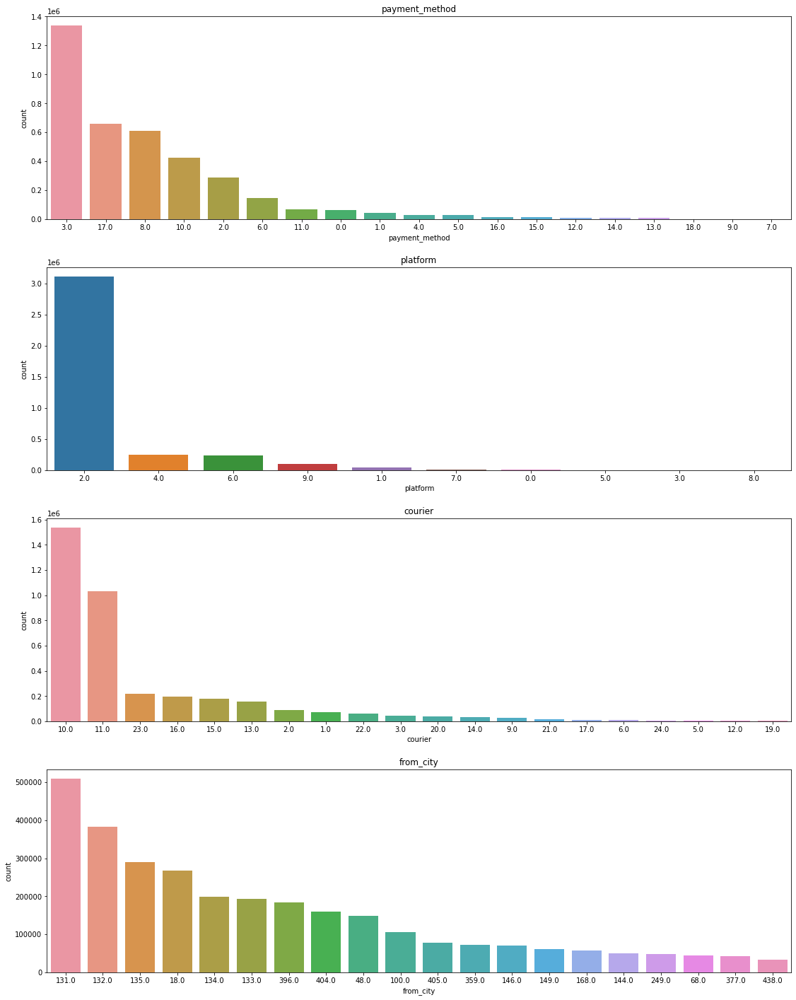

In [9]:
count_plot(payments[category], 20)

#### payment_method: For payment_method, the most used one in the dataset is 3.0, followed by 27.0, 8.0, 30.0, 2.0, while the rest have insignificant count values. This might be worth considering when Bukalapak wants to design a promo using one of the top 5 payment_method or platform as a partner.

#### platform: I'm assuming that platform is how a user accesses the Apps (android, iOS, web, etc.). For platform, the huge majority of the transactions were done using platform 2.0. Again, this is important when the team is designing a promotion or marketing event for specific platform.

#### courier: For courier, there are two couriers that are significantly more used by the buyers compared to others, which are courier 16.0 and 11.0. This information is important when designing a promotion of discount or free shipping fee with specific logistic service providers

#### from_city: For from_city columns, since the cities are encoded and no information is given, there are no valuable insights that could be gathered from the graph. I'm assuming that the ones that have significant count values are cities that are high in population or major cities.

In [10]:
numerical_cols = ['gmv', 'courier_cost', 'weight']

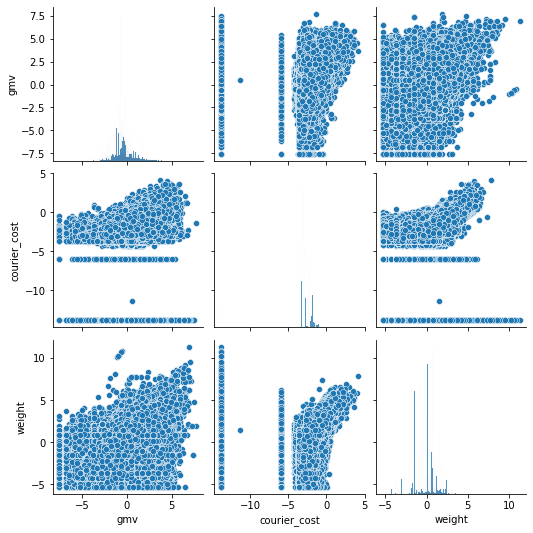

In [11]:
sns.pairplot(payments[numerical_cols])

#### From the pair plots of courier_cost, it can be seen that courier_cost are constant for some values, namely around -6 and -15, regardless of the pairing variable. The possible explanation for this is that this might be the minimum price for the courier service for some providers, although it might also depend on the weight and distance.

### Looking for Anomaly

#### Checking if the users' IDs in Payments Dataset are also in Users Dataset

In [12]:
print('Number of Unique Buyer ID Registered In Users Dataset:')
print(payments['buyer_id'].drop_duplicates(keep = 'first').isin(users['id']).value_counts())

Number of Unique Buyer ID Registered In Users Dataset:
True     1186764
False     177451
Name: buyer_id, dtype: int64


In [13]:
print('Number of Non-Unique Buyer ID Registered In Users Dataset:')
print(payments['buyer_id'].isin(users['id']).value_counts())

Number of Non-Unique Buyer ID Registered In Users Dataset:
True     3566855
False     183768
Name: buyer_id, dtype: int64


In [14]:
print('Number of Unique Seller ID Registered In Users Dataset:')
print(payments['seller_id'].drop_duplicates(keep = 'first').isin(users['id']).value_counts())

Number of Unique Seller ID Registered In Users Dataset:
True     222651
False         1
Name: seller_id, dtype: int64


In [15]:
print('Number of Non-Unique Seller ID Registered In Users Dataset:')
print(payments['seller_id'].isin(users['id']).value_counts())

Number of Non-Unique Seller ID Registered In Users Dataset:
True     3749777
False        846
Name: seller_id, dtype: int64


In [16]:
payments[~payments['seller_id'].isin(users['id'])]['seller_id']

760       -1
1452      -1
2790      -1
6258      -1
17621     -1
          ..
3745944   -1
3746443   -1
3746632   -1
3747630   -1
3749345   -1
Name: seller_id, Length: 846, dtype: int64

In [17]:
payments[~payments['seller_id'].isin(users['id'])]['seller_id'].value_counts()

-1    846
Name: seller_id, dtype: int64

#### There are 177451 unique buyer_id that are not registered in users dataset, while the seller_id that are not registered in the users dataset are all -1 (I think this might be an error). One of the possible reasons for this is they might have deactivated their account or email (if possible) or there might be some error on the backend. This might be worth taking a look into as to find the reason behind this phenomenon.

In [18]:
min_buyer_id = min(payments['buyer_id'])
max_buyer_id = max(payments['buyer_id'])
print(f'Lowest number of buyer ID: {min_buyer_id}')
print(f'Highest number of buyer ID: {max_buyer_id}')

Lowest number of buyer ID: -1
Highest number of buyer ID: 71022539


In [19]:
min_seller_id = min(payments['seller_id'])
max_seller_id = max(payments['seller_id'])
print(f'Lowest number of seller ID: {min_seller_id}')
print(f'Highest number of seller ID: {max_seller_id}')

Lowest number of seller ID: -1
Highest number of seller ID: 70989849


In [20]:
payments = payments[payments['buyer_id'] != -1]
payments = payments[payments['seller_id'] != -1]
payments = payments.reset_index().drop('index', axis = 1)

#### Here we observe that the dataset contains -1 for buyer_id and seller_id columns, which I think are errors. Therefore, we proceed with removing these rows from the dataset.

#### Checking for number of times the same seller and buyer has done.

In [21]:
check = payments[payments[['buyer_id', 'seller_id', 'courier', 'weight','gmv', 'payment_method']].duplicated(keep = False)].sort_values('buyer_id')

#### Usually for an online market platform, a fraudulent transaction prone to happen and this type of transaction is usually done to benefit the buyer and seller (which usually is the same person) through cashbacks, promos, points, and many more. This phenomenon is undesirable and flagging a certain transaction as fraudulent is quite a sensitive issue. To be extra certain, I included columns buyer_id, seller_id, courier, weight, gmv, and payment_method to be checked for duplicated. If the number of similar transactions happen above the threshold value, the transaction that is done by the same buyer and seller will be flagged as suspicious. In this case, the threshold value is 30. (Note that the threshold value can be adjusted according to the needs, in this case, I assume buying an item with similar gmv  and weight from the same seller for 30 times is suspicious.)

In [22]:
n_duplicates = check.groupby(['buyer_id','seller_id'], as_index = False).size().sort_values('size', ascending = False)

In [23]:
threshold = 29
flag_list = n_duplicates[n_duplicates['size'] > threshold]

In [24]:
flag_list = flag_list.reset_index().drop('index', axis = 1)

In [25]:
flag_list

,buyer_id,seller_id,size
0,54430415,45321748,165
1,47089738,39510188,143
2,16102126,26745557,133
3,63086320,31950582,108
4,22781816,46137413,101
...,...,...,...
817,59551240,58768465,30
818,32845077,42195283,30
819,46077903,50242918,30
820,62113710,50242918,30


In [26]:
check['flag'] = 'False'

In [27]:
check = check.reset_index().drop('index', axis=1)

In [28]:
for i in range(0,len(check)):
    if flag_list['buyer_id'].isin([check['buyer_id'].loc[i]]).any():
        check['flag'].loc[i] = 'True'

In [29]:
check['flag'].value_counts()

False    267023
True      42553
Name: flag, dtype: int64

In [30]:
sus_trx = check[check['flag'] == 'True']

In [31]:
payments['flag'] = 'False'

In [32]:
sus_index = payments[payments['id'].isin(sus_trx['id'])].index

In [33]:
payments['flag'].loc[sus_index] = 'True'

In [34]:
payments['flag'].value_counts()

False    3706798
True       42553
Name: flag, dtype: int64

#### Based on the analysis, there are 42553 transactions on payments dataset that are marked as suspicious.

## Analysing Promos Dataset

In [35]:
promos

,id,trx_id,promo_type,promo_campaign,amount
0,46478917,289827077,1,229.0,-1.836041
1,46553917,290371792,0,101.0,-2.241503
2,46518017,290084112,1,229.0,-1.836041
3,46416017,289494337,1,228.0,-0.988747
4,46308117,288920802,1,229.0,-1.836041
...,...,...,...,...,...
1388489,50295696,317758966,1,229.0,-1.836041
1388490,50074139,316028111,0,101.0,-2.529182
1388491,50171264,316805741,1,229.0,-1.836041
1388492,50107319,316315111,1,229.0,-1.836041


In [36]:
show_null_columns(promos)

,missing rows,percentage


#### No null values are observed for this dataset

In [37]:
category = ['promo_type', 'promo_campaign']

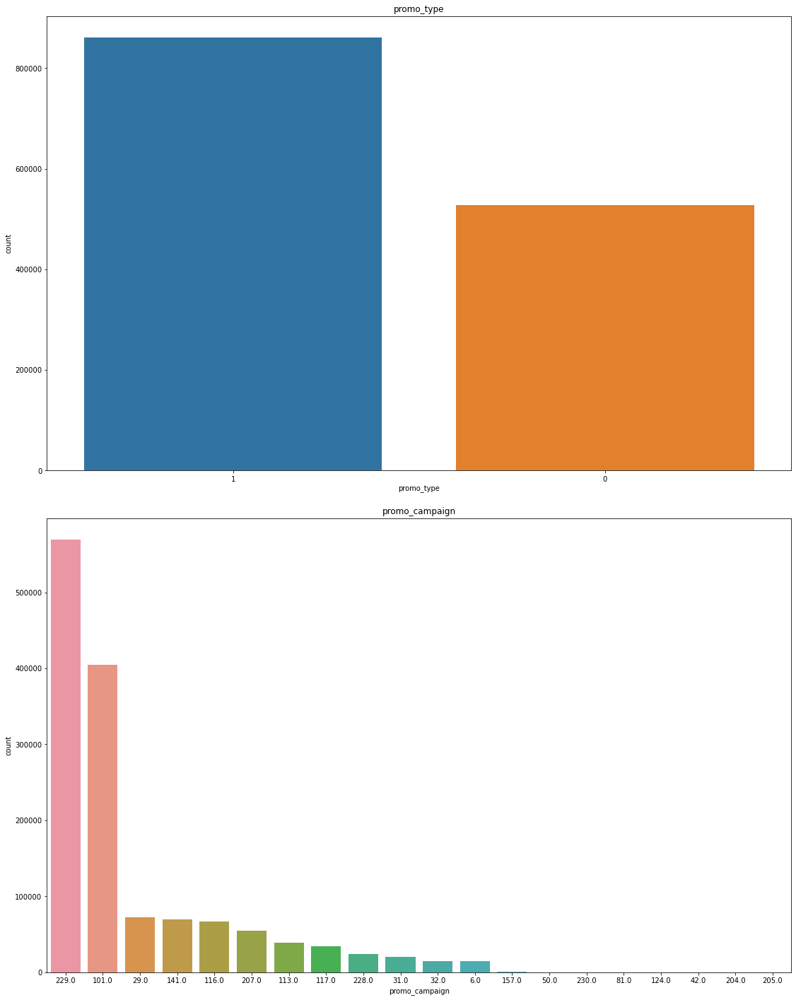

In [38]:
count_plot(promos[category], 20)

#### As observed from the graphs above, the most common promo type is 1, while promo type 0 is approximately 65% of the total count of promo type 1. For the promo_campaign column, 229 and 301 are the most common ones, followed by the rest which are insignificant in count value compared to 229 and 301. Hence, it is safe to say that promo_campaign 229 and 301 are the most popular ones amongst users. If we can get the information on the details of these promo campaigns, more valuable insights can be gathered to be analyzed.

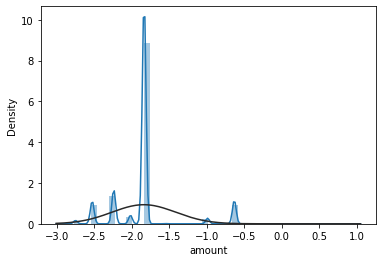

In [39]:
sns.distplot(promos['amount'], fit = norm)

#### The column amount in this dataset seems to have been scaled with some kind of scaler. In the distribution plot, the most common amount observed is around -2.0 to -1.7. There are other peaks observed such as -2.7 to -2.3, -2.3 to -2.1, and -0.8 to -0.5. 

In [40]:
promos['frequency'] = promos['promo_campaign'].map(promos['promo_campaign'].value_counts())

In [41]:
promos[['amount', 'frequency']].corr()

,amount,frequency
amount,1.000000,-0.209447
frequency,-0.209447,1.000000


Text(0.5, 1.0, 'Scatter Plot of Promos Frequency Versus Promos Amount')

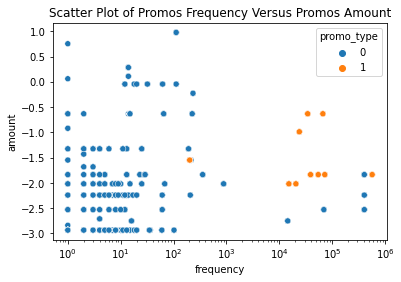

In [42]:
ax = sns.scatterplot(data = promos, x = 'frequency', y = 'amount', hue = 'promo_type')
ax.set(xscale = 'log')
ax.set_title('Scatter Plot of Promos Frequency Versus Promos Amount')

#### It seems that there is slight correlation between amount and the frequency on how many times promo_campaign appears on the dataset. This indicates a 'slight' inverse relationship, which means that the bigger the amount of the promotion, the less times it will apear on the dataset, which is logical.

In [43]:
count_df = promos[['promo_campaign', 'promo_type']].drop_duplicates()

Text(0.5, 1.0, 'Value Counts for Promo Type')

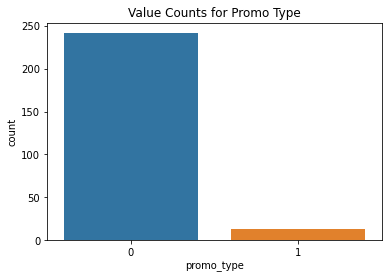

In [44]:
sns.countplot(data = count_df, x = 'promo_type')
plt.title('Value Counts for Promo Type')

#### Strangely, promos with type 1 is tiny in comparison to promos with type 0 when we count it based on promo campaigns. It means that there are more promo campaigns with type 0 compared to the ones with type 1. It is observed earlier that promos with type 1 seems to be used more than promos with type 0, this might indicates that promos with type 1 are more popular to users. If it is the case, then promos with type 1 should be initiated more. This information might be useful to the marketing team and other business stakeholders to look at.

## Analysing Users Dataset

In [45]:
users

,id,email_domain,created_at,first_paid_at,first_upload_at,gender
0,65598151,2138.0,1390305430000,1.390621e+12,NaN,1.0
1,66861351,2649.0,1391003403000,1.391053e+12,NaN,0.0
2,17538132,6615.0,1341889024000,1.350179e+12,1.350026e+12,0.0
3,30822232,2138.0,1363158494000,1.404788e+12,1.363790e+12,1.0
4,19476124,2138.0,1345456103000,1.375953e+12,1.376098e+12,0.0
...,...,...,...,...,...,...
1328716,70165648,2138.0,1392559213000,1.392704e+12,NaN,0.0
1328717,38241748,2138.0,1370400868000,1.370692e+12,NaN,0.0
1328718,9221446,6615.0,1322538356000,1.322539e+12,1.387385e+12,0.0
1328719,53169025,2138.0,1383291998000,1.383552e+12,1.386323e+12,0.0


In [46]:
show_null_columns(users)

,missing rows,percentage
first_upload_at,815928,61.407
first_paid_at,41907,3.154


#### Some null values are observed for first_upload_at and first_paid_at on this dataset

Text(0.5, 1.0, 'Value Counts for Gender in Users Dataset')

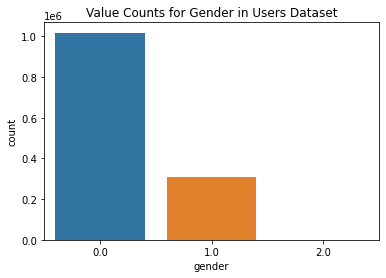

In [47]:
sns.countplot(data = users, x = 'gender')
plt.title('Value Counts for Gender in Users Dataset')

In [48]:
users['gender'].value_counts()

0.0    1018248
1.0     310334
2.0        139
Name: gender, dtype: int64

#### It is observed here that the majority of users in users dataset have 0.0 as gender, in fact, around three times the values compared to gender 1.0. It is safe to say that the app might be more popular to gender 0.0. This is an important information for designing marketing or promotional activities, which depends on the strategy of the marketing team. Do they want to engage gender 0.0 which is the majority of the users to maximize the engagement or do they want to reach out to gender 1.0 to bump up the values? (Gender 2.0 is very insignificant compared to the other two gender, I'm assuming this would be "unspecified" gender.

#### If a user has NaN value on the first_paid_at column, it is assumed that they never buys anything and will not be considered as buyer. Similarly, when a use rhas a NaN value on the first_upload_at column, it is assumed that they never sells anything and will not be considered as seller.

In [49]:
users['buyer'] = 0
users['seller'] = 0

In [50]:
buyer_index = users[users['first_paid_at'].notna()].index
seller_index = users[users['first_upload_at'].notna()].index

In [51]:
users['buyer'].loc[buyer_index] = 1
users['seller'].loc[seller_index] = 1

In [52]:
users['buyer'].value_counts()

1    1286814
0      41907
Name: buyer, dtype: int64

In [53]:
users['seller'].value_counts()

0    815928
1    512793
Name: seller, dtype: int64

#### There are around two times more buyer than seller in this users dataset

In [54]:
users_buy = users[users['first_paid_at'].notna()].drop(['buyer', 'seller'], axis = 1).rename(columns = {'email_domain' : 'email_domain_buyer',
                                    'created_at' : 'created_at_buyer',
                                    'first_paid_at' : 'first_paid_at_buyer',
                                    'first_upload_at' : 'first_upload_at_buyer',
                                    'gender' : 'gender_buyer'})

In [55]:
users_sell = users[users['first_upload_at'].notna()].drop(['buyer', 'seller'], axis = 1).rename(columns = {'email_domain' : 'email_domain_seller',
                                    'created_at' : 'created_at_seller',
                                    'first_paid_at' : 'first_paid_at_seller',
                                    'first_upload_at' : 'first_upload_at_seller',
                                    'gender' : 'gender_seller'})

Text(0.5, 1.0, 'Value Counts for Gender in Users Dataset Only For Buyer')

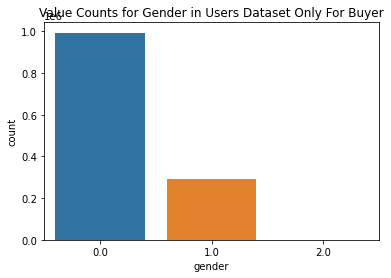

In [56]:
sns.countplot(data = users[users['buyer'] == 1], x = 'gender')
plt.title('Value Counts for Gender in Users Dataset Only For Buyer')

Text(0.5, 1.0, 'Value Counts for Gender in Users Dataset Only For Seller')

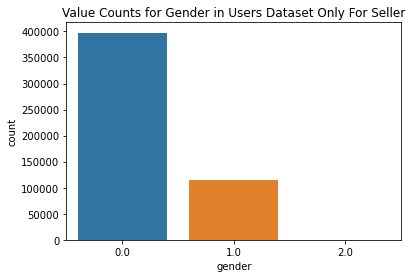

In [57]:
sns.countplot(data = users[users['seller'] == 1], x = 'gender')
plt.title('Value Counts for Gender in Users Dataset Only For Seller')

#### The distribution of gender seems to be similar for seller, buyer, and overall. It can be seen that the majority of the gender is 0. Knowing which gender to target is an important strategy when designing for marketing and promotional activities. Again, this information will help the marketing team to decide which type of marketing or promotional activities they should design and implement, depending on the targetted gender (e.g. if they want to engage more gender 1, since it is currently way below gender 0, they should design a marketing activity that would be suitable for gender 1.)

## Merging Three Datasets Together to Gain More Insights

#### In this process, I noticed that the values for id on payments dataset and trx_id on promos dataset are similar, so I assumed they refer to the same identification column. As for the users, I also noticed that the column id on users dataset and buyer_id & seller_id on payments dataset are similar. Using these mentioned columns as the key, I merged the datasets together.

In [58]:
merge_df1 = pd.merge(payments, promos, how = 'left', left_on = 'id', right_on = 'trx_id')

In [59]:
merge_df1 = merge_df1.rename(columns = {'id_x' : 'payment_id',
                             'id_y' : 'promo_id'}).drop('trx_id', axis=1)

In [60]:
merge_df2 = pd.merge(merge_df1, users_buy, left_on = 'buyer_id', right_on = 'id', how = 'left',  indicator = True).drop('id', axis=1)

In [61]:
merge_df2 = merge_df2[merge_df2['_merge'] == "both"].drop('_merge', axis=1)

In [62]:
merge_df3 = pd.merge(merge_df2, users_sell, left_on = 'seller_id', right_on = 'id', how = 'left',  indicator = True).drop('id', axis=1)

In [63]:
#to avoid confusion in naming
merge_df = merge_df3.drop('_merge', axis = 1)

In [64]:
merge_df

,payment_id,buyer_id,seller_id,created_at,paid_at,remitted_at,refunded_at,gmv,courier_cost,payment_method,platform,courier,from_city,weight,flag,promo_id,promo_type,promo_campaign,amount,frequency,email_domain_buyer,created_at_buyer,first_paid_at_buyer,first_upload_at_buyer,gender_buyer,email_domain_seller,created_at_seller,first_paid_at_seller,first_upload_at_seller,gender_seller
0,269765999,65197005,6053878,1390613609000,1391580501000,1.392379e+12,NaN,0.284217,-1.047587,3.0,2.0,11.0,131.0,-0.802699,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.390107e+12,1.391581e+12,NaN,0.0,6618.0,1311472895000,1.317731e+12,1.311476e+12,0.0
1,275910489,62950005,18553452,1390887342000,1391572136000,1.391706e+12,NaN,-2.752322,-2.934641,3.0,2.0,10.0,133.0,-1.992136,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.388850e+12,1.388923e+12,1.390742e+12,0.0,2138.0,1343721946000,1.347754e+12,1.343724e+12,1.0
2,289132662,24879866,14589697,1391564507000,1391566203000,1.391758e+12,NaN,-2.752322,-2.934641,2.0,2.0,10.0,133.0,-2.170343,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.355483e+12,1.368540e+12,1.400835e+12,0.0,2138.0,1335525907000,1.342196e+12,1.335527e+12,0.0
3,289133762,854024,17222100,1391564549000,1391579111000,1.391917e+12,NaN,0.284217,-2.059183,3.0,2.0,10.0,48.0,0.801706,False,46349077.0,0.0,101.0,-2.241503,404421.0,2138.0,1.271646e+12,1.331831e+12,NaN,0.0,2138.0,1341213127000,1.343700e+12,1.341295e+12,0.0
4,290233762,42333518,300520,1391603797000,1391604679000,NaN,1.391659e+12,-2.246516,-2.672281,3.0,2.0,16.0,131.0,-1.489591,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.374509e+12,1.376454e+12,1.380208e+12,0.0,6618.0,1253025463000,1.254556e+12,1.253030e+12,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3558397,318022257,3612277,1339245,1392734269000,1392734271000,1.393166e+12,NaN,-1.836041,-2.292796,8.0,2.0,10.0,131.0,-2.664877,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.304742e+12,1.306279e+12,1.304744e+12,0.0,2138.0,1282196560000,1.317290e+12,1.282199e+12,0.0
3558398,317532257,55110625,23922962,1392719786000,1392720144000,1.393048e+12,NaN,0.747951,-1.176798,2.0,2.0,10.0,396.0,1.494222,False,NaN,NaN,NaN,NaN,NaN,2138.0,1.384454e+12,1.384526e+12,NaN,1.0,2138.0,1353636270000,1.364435e+12,1.353817e+12,1.0
3558399,316832257,6102988,16832536,1392700359000,1392705308000,1.393079e+12,NaN,-0.409730,-1.453051,3.0,2.0,10.0,18.0,1.494222,False,50174582.0,0.0,101.0,-2.529182,404421.0,2138.0,1.311625e+12,1.311633e+12,NaN,1.0,2138.0,1340445965000,NaN,1.342458e+12,0.0
3558400,316132257,39811363,204069,1392683062000,1392683064000,1.393221e+12,NaN,0.463199,-2.934641,8.0,2.0,10.0,133.0,-0.399328,False,50087075.0,1.0,229.0,-1.836041,569237.0,2138.0,1.372072e+12,1.372075e+12,1.380343e+12,0.0,2138.0,1242850272000,1.379183e+12,1.242850e+12,0.0


In [65]:
show_null_columns(merge_df)

,missing rows,percentage
refunded_at,3347914,94.085
promo_id,2169886,60.979
promo_type,2169886,60.979
promo_campaign,2169886,60.979
amount,2169886,60.979
frequency,2169886,60.979
first_upload_at_buyer,2108786,59.262
remitted_at,207423,5.829
first_paid_at_seller,157391,4.423


#### Some null values are observed from the merged dataset. The null values on refunded_at and remitted_at columns have been explained previously. The null values on promo_id, promo_type, promo_campaign, amount_ and frequency mean that the transactions did not use a promo. The null values on first_upload_at_buyer means that the buyers on the transactions have never uploaded an items to be sold. Similarly, the null values on first_paid_at_seller means that the sellers on the transactions have never bought any items. Note that these numbers are not for unique values.

#### Creating total_paid column to see the actual amount that people spent on a transaction, which will be the merchandise price (gmv), plus courier_cost, and minus promo amount if any. However, since all the mentioned variables have been scaled beforehand with some kind of scaler, I will scale them again using a determined limit to normalize them. The scaled values will not reflect the actual magnitude of the values, but it will give the general idea on how big the total paid amount would be.

Text(0.5, 1.0, 'Distribution Plot For GMV')

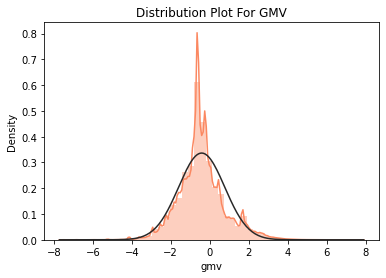

In [66]:
sns.distplot(merge_df['gmv'], fit = norm, color = '#FB8861')
plt.title('Distribution Plot For GMV')

#### GMV column seems to have normal distribution with peak on the middle.

Text(0.5, 1.0, 'Distribution Plot For Courier Cost')

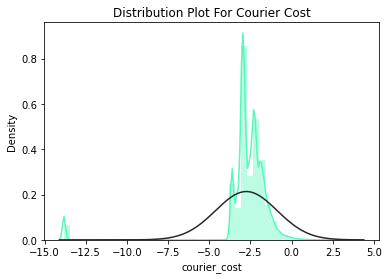

In [67]:
sns.distplot(merge_df['courier_cost'], fit = norm, color = '#56F9BB')
plt.title('Distribution Plot For Courier Cost')

#### For courier_cost, the majority of the distribution is located at -4.0 to -0.5.

Text(0.5, 1.0, 'Distribution Plot For Promos Amount')

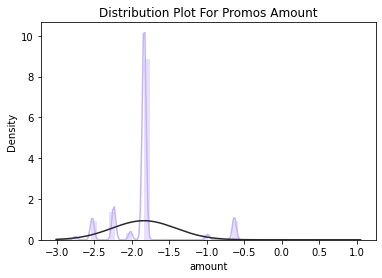

In [68]:
sns.distplot(merge_df[merge_df['amount'].notna()]['amount'], fit = norm, color = '#C5B3F9')
plt.title('Distribution Plot For Promos Amount')

#### The distribution for amount column is the same as described earlier.

In [69]:
scaler = MinMaxScaler()

In [70]:
scaled_cols = ['gmv', 'courier_cost', 'amount']
for col in scaled_cols:
    merge_df[f'{col}_scaled'] = scaler.fit_transform(np.array(merge_df[col]).reshape(-1,1))

In [71]:
merge_df['total_paid_scaled'] = merge_df['gmv_scaled'] + merge_df['courier_cost_scaled']

In [72]:
promo_index = merge_df[merge_df['amount'].notna()].index

In [73]:
merge_df['total_paid_scaled'].loc[promo_index] = merge_df['gmv_scaled'].loc[promo_index] + merge_df['courier_cost_scaled'].loc[promo_index] - merge_df['amount_scaled'].loc[promo_index]

Text(0.5, 1.0, 'Distribution Plot For Total Paid Amount')

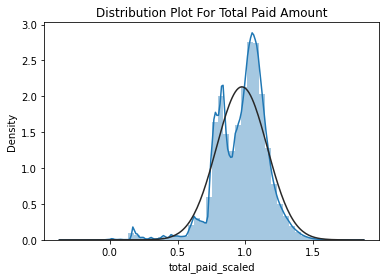

In [74]:
sns.distplot(merge_df['total_paid_scaled'], fit = norm)
plt.title('Distribution Plot For Total Paid Amount')

Text(0.5, 1.0, 'Box Plot For Total Paid Amount')

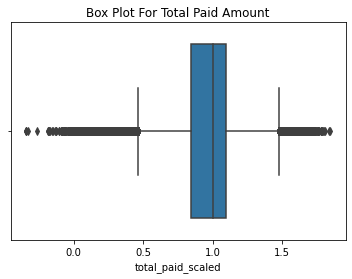

In [75]:
sns.boxplot(merge_df['total_paid_scaled'])
plt.title('Box Plot For Total Paid Amount')

#### From the boxplot above, the mean is observed to be approximately at the value of 1.0. Numerous outliers are also detected which are below 0.5 and more than 1.5. Again, since the values have been scaled, I cannot comment on how extreme these outliers are.

### Checking variables correlation on the merged dataset

In [76]:
corr = merge_df.corr()

corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,payment_id,buyer_id,seller_id,created_at,paid_at,remitted_at,refunded_at,gmv,courier_cost,payment_method,platform,courier,from_city,weight,promo_id,promo_type,promo_campaign,amount,frequency,email_domain_buyer,created_at_buyer,first_paid_at_buyer,first_upload_at_buyer,gender_buyer,email_domain_seller,created_at_seller,first_paid_at_seller,first_upload_at_seller,gender_seller,gmv_scaled,courier_cost_scaled,amount_scaled,total_paid_scaled
payment_id,1.00,0.00,-0.03,1.00,1.00,0.91,0.79,0.01,-0.01,-0.03,0.01,-0.01,-0.01,-0.02,1.00,0.05,-0.02,-0.17,-0.01,-0.00,-0.01,-0.00,0.00,-0.02,0.00,-0.02,-0.01,-0.02,-0.02,0.01,-0.01,-0.17,0.11
buyer_id,0.00,1.00,0.28,0.00,0.00,-0.02,0.05,-0.07,-0.11,0.20,-0.10,0.04,0.06,0.00,-0.01,0.00,-0.21,-0.02,-0.26,-0.01,0.90,0.81,0.58,0.23,-0.00,0.22,0.18,0.23,0.12,-0.07,-0.11,-0.02,-0.19
seller_id,-0.03,0.28,1.00,-0.03,-0.03,-0.07,0.02,-0.02,-0.14,0.15,-0.07,0.00,0.04,0.03,-0.06,-0.00,-0.13,-0.00,-0.15,0.09,0.21,0.20,0.11,0.14,-0.11,0.87,0.74,0.81,0.16,-0.02,-0.14,-0.00,-0.23
created_at,1.00,0.00,-0.03,1.00,1.00,0.92,0.79,0.01,-0.01,-0.03,0.01,-0.01,-0.01,-0.02,1.00,0.05,-0.02,-0.18,-0.00,-0.00,-0.01,-0.00,0.00,-0.02,0.00,-0.02,-0.01,-0.02,-0.02,0.01,-0.01,-0.18,0.12
paid_at,1.00,0.00,-0.03,1.00,1.00,0.92,0.79,0.01,-0.01,-0.03,0.01,-0.01,-0.01,-0.02,1.00,0.05,-0.02,-0.18,-0.00,-0.00,-0.01,-0.00,0.00,-0.02,0.00,-0.02,-0.01,-0.02,-0.02,0.01,-0.01,-0.18,0.12
remitted_at,0.91,-0.02,-0.07,0.92,0.92,1.00,0.35,0.01,0.01,-0.05,0.02,0.05,-0.01,-0.02,0.95,0.04,-0.01,-0.18,0.03,-0.02,-0.02,-0.01,-0.01,-0.03,-0.00,-0.05,-0.03,-0.05,-0.02,0.01,0.01,-0.18,0.15
refunded_at,0.79,0.05,0.02,0.79,0.79,0.35,1.00,-0.02,-0.01,0.01,-0.01,0.02,0.00,-0.01,0.81,-0.01,-0.05,-0.16,-0.07,0.02,0.04,0.04,0.01,0.01,0.01,0.01,0.01,0.01,0.01,-0.02,-0.01,-0.16,0.03
gmv,0.01,-0.07,-0.02,0.01,0.01,0.01,-0.02,1.00,0.06,-0.02,0.03,-0.12,0.02,0.42,0.11,0.35,0.16,0.61,0.05,-0.00,-0.07,-0.07,-0.05,-0.04,0.00,-0.02,-0.01,-0.00,-0.05,1.00,0.06,0.61,0.19
courier_cost,-0.01,-0.11,-0.14,-0.01,-0.01,0.01,-0.01,0.06,1.00,-0.06,0.03,-0.09,-0.02,0.15,-0.02,-0.20,-0.04,-0.04,0.12,-0.07,-0.07,-0.07,-0.02,-0.06,-0.03,-0.10,-0.08,-0.11,-0.04,0.06,1.00,-0.04,0.62
payment_method,-0.03,0.20,0.15,-0.03,-0.03,-0.05,0.01,-0.02,-0.06,1.00,-0.04,0.03,0.05,0.01,-0.01,0.02,-0.12,0.03,-0.19,0.10,0.15,0.16,0.01,0.14,0.01,0.11,0.10,0.13,0.10,-0.02,-0.06,0.03,-0.24


### Analysing gmv column

In [77]:
num_cols = ['courier_cost_scaled', 'amount_scaled', 'weight', 'total_paid_scaled']

In [78]:
def srt_box(y, df, categorical_cols, n):
    fig, axes = plt.subplots(round(len(df[categorical_cols].columns)/2), 2, figsize = (25, 25))
    axes = axes.flatten()
    plt.rcParams.update({'font.size': 22})
    for i, j in zip(df[categorical_cols].columns, axes):
        
        sortd = df.groupby([i])[y].median().sort_values(ascending = False)
        sns.boxplot(x = i, y = y, data = df,
                    palette = 'plasma', order = sortd.iloc[:n].index,
                    ax = j)
        
        plt.tight_layout(pad = 2.0)

In [79]:
categorical_cols = ['payment_method', 'platform', 'courier', 'from_city',
                   'flag', 'promo_campaign', 'gender_buyer', 'gender_seller']

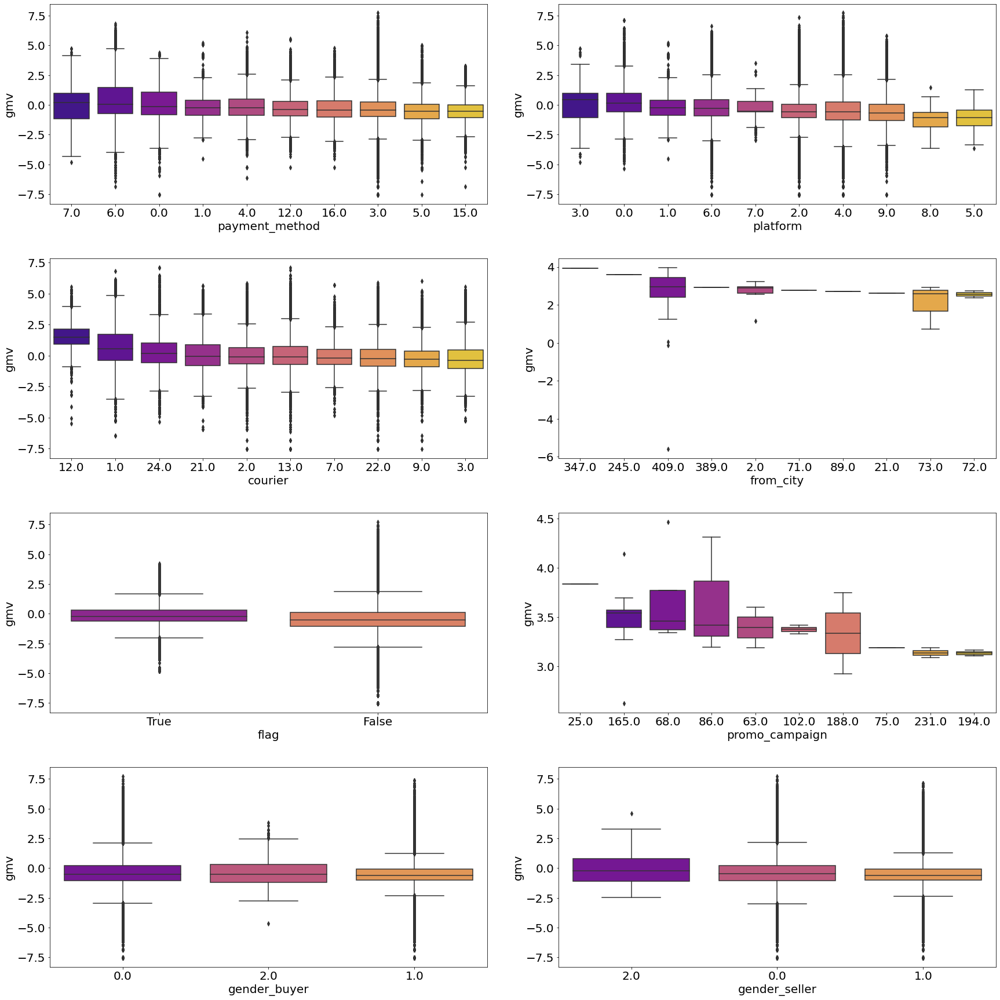

In [80]:
plt.rcParams.update({'font.size': 20})
srt_box('gmv', merge_df, categorical_cols, 10)

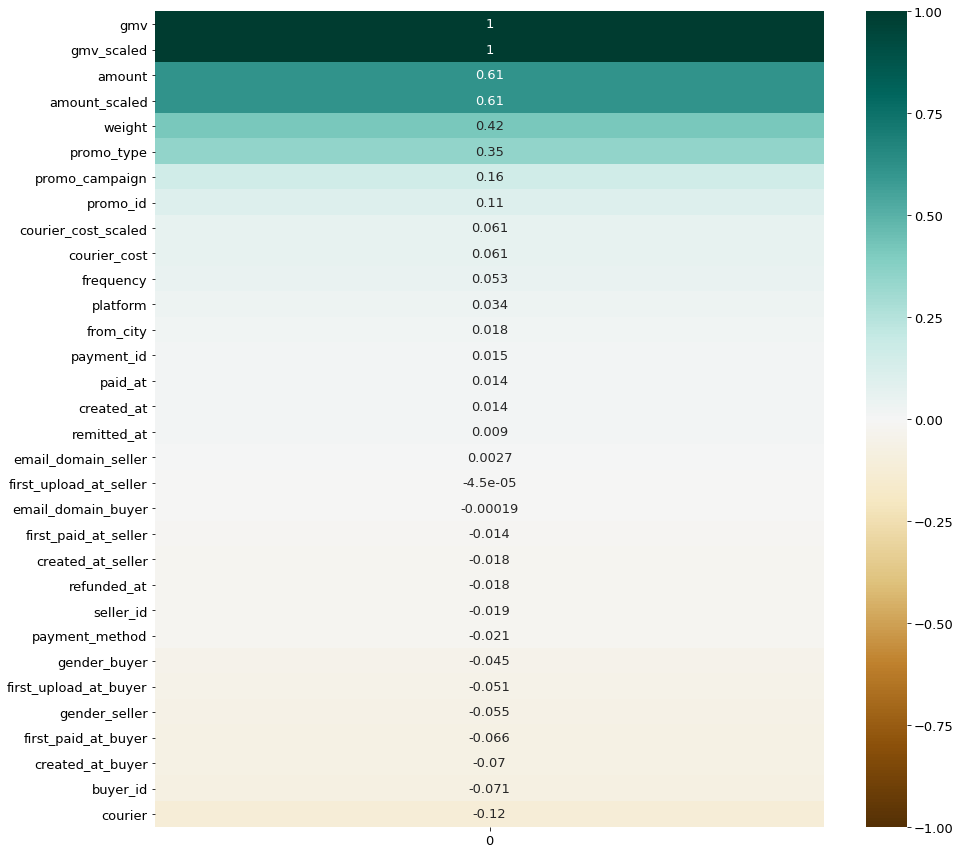

In [81]:
plt.rcParams.update({'font.size': 13})
correlations = merge_df.corrwith(merge_df['gmv']).iloc[:-1].to_frame()
sorted_correlations = correlations.sort_values(0, ascending = False)[0]
fig, ax = plt.subplots(figsize = (15, 15))
sns.heatmap(sorted_correlations.to_frame(), cmap = 'BrBG', annot = True, vmin = -1, vmax = 1, ax=ax)

Text(0.5, 1.0, 'Scatter Plot of GMV Versus Promotion Amount')

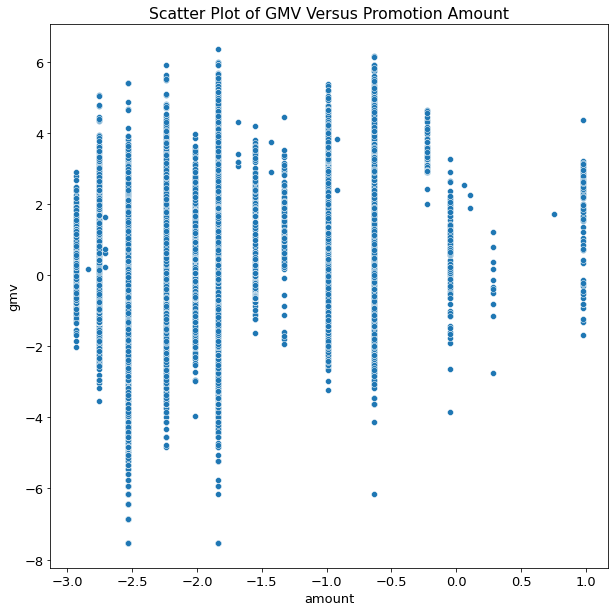

In [82]:
plt.figure(figsize = (10,10))
sns.scatterplot(data = merge_df[merge_df['amount'].notna()], x = 'amount', y = 'gmv')
plt.title('Scatter Plot of GMV Versus Promotion Amount')

#### From the correlation diagram above, the most significant correlation values to gmv are from weight and promotion amount. The relationship between gmv and weight has been explained previously. It is observed that the correlation value of gmv and promotion amount is 0.61, which indicates a proportional relationship (e.g. when promotion amount increases, gmv value might get increased as well).

### Checking flagged transactions

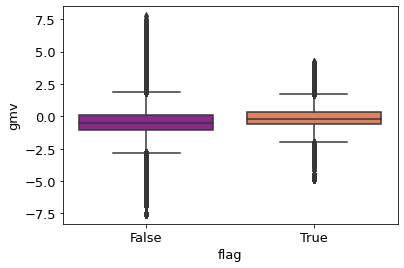

In [83]:
sns.boxplot(data = merge_df, x = 'flag', y = 'gmv', palette = 'plasma')

#### The transactions that are flagged as suspicious have slightly bigger mean gmv values than the ones that are not flagged.

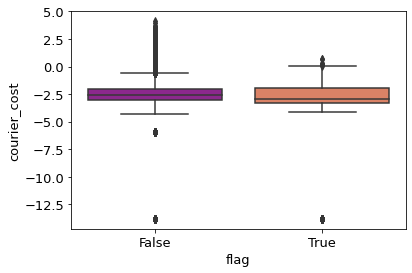

In [84]:
sns.boxplot(data = merge_df, x = 'flag', y = 'courier_cost', palette = 'plasma')

#### The flagged transactions have smaller mean compared to the ones that are not flagged. The maximum value of the courier_cost for suspicious transactions are also considerably lower.

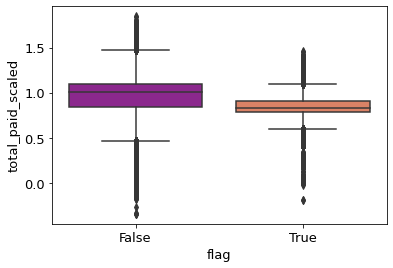

In [85]:
sns.boxplot(data = merge_df, x = 'flag', y = 'total_paid_scaled', palette = 'plasma')

#### The mean of total_paid_scaled amount for transactions that are flagged as suspicious is lower in comparison to the transactions that are not flagged. The range of maximum and minimum is also smaller.

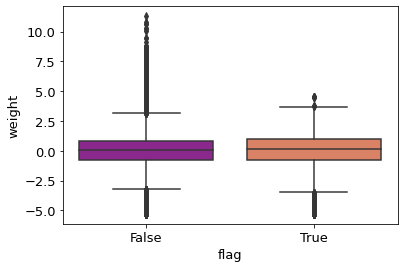

In [86]:
sns.boxplot(data = merge_df, x = 'flag', y = 'weight', palette = 'plasma')

#### The maximum weight of the items purchased for flagged transactions is considerably smaller compared to the transactions that are not flagged.

#### Getting unique value for each pair of buyer_id and seller_id in the same transaction that is flagged as suspicious to analyze

In [87]:
flag_true = merge_df[merge_df['flag'] == 'True']

In [88]:
unique_df = flag_true[['buyer_id', 'seller_id']].drop_duplicates(keep = 'first')

In [89]:
unique_flagged_users = flag_true.loc[unique_df.index]

Text(0.5, 1.0, 'Values Count for Gender of Buyer With Flagged Transaction')

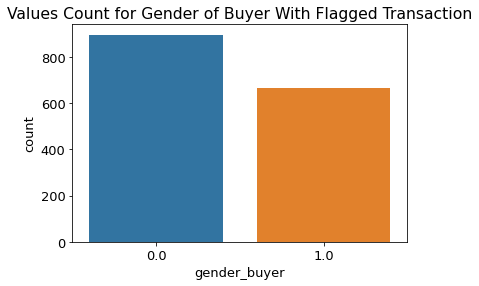

In [90]:
sns.countplot(unique_flagged_users['gender_buyer'])
plt.title('Values Count for Gender of Buyer With Flagged Transaction')

Text(0.5, 1.0, 'Values Count for Gender of Seller With Flagged Transaction')

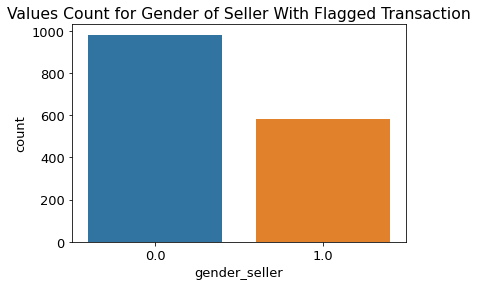

In [91]:
sns.countplot(unique_flagged_users['gender_seller'])
plt.title('Values Count for Gender of Seller With Flagged Transaction')

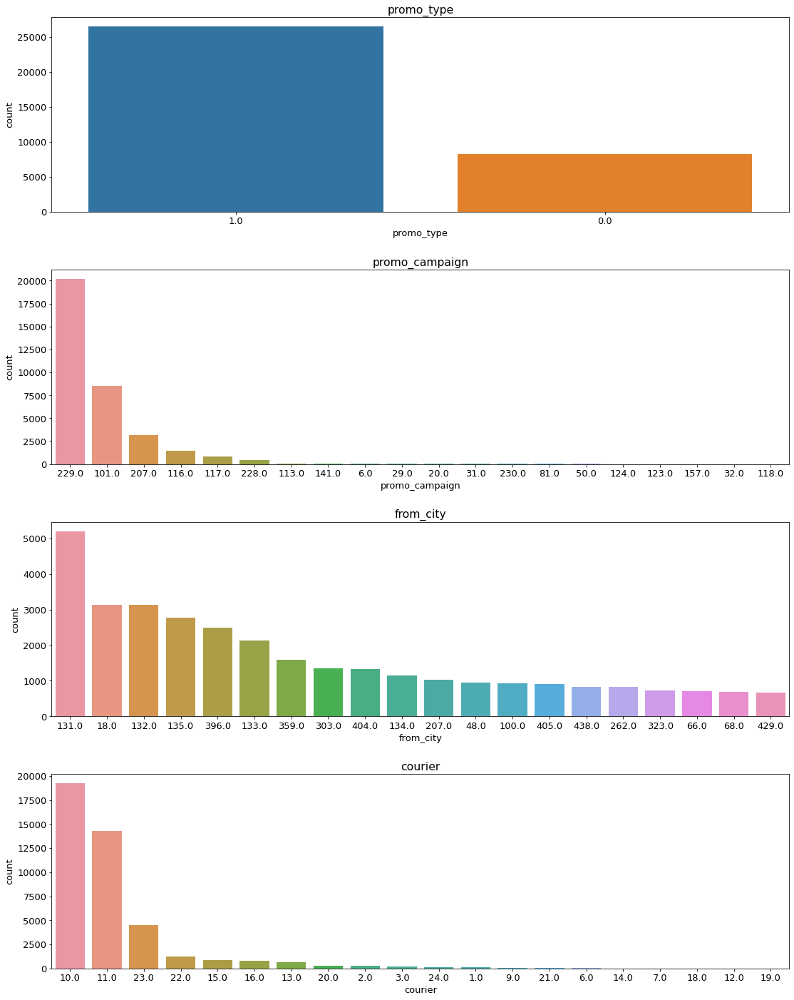

In [92]:
count_plot(flag_true[['promo_type', 'promo_campaign', 'from_city', 'courier']], 20)

### Analyzing users that asked for refund on their purchased items

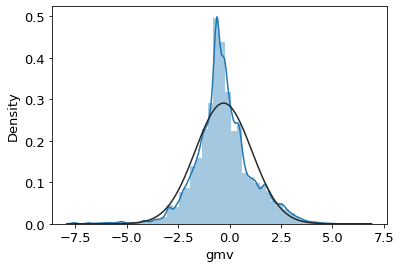

In [93]:
sns.distplot(merge_df[merge_df['refunded_at'].notna()]['gmv'], fit = norm)

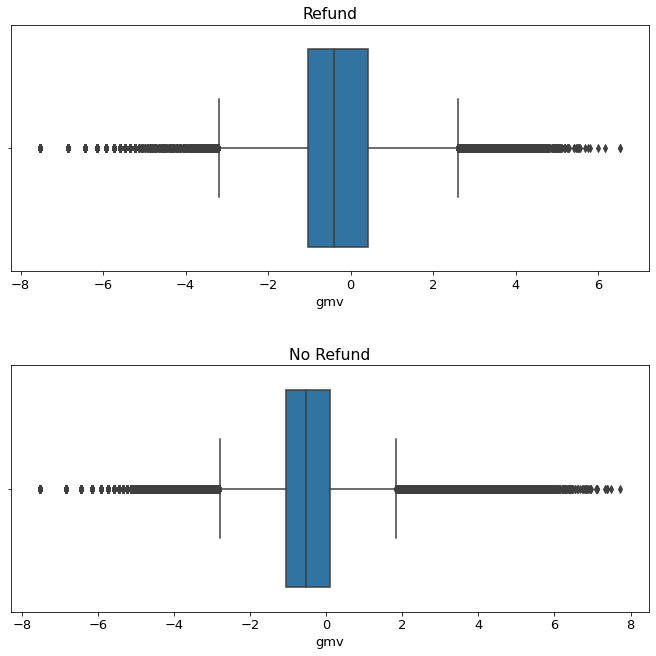

In [94]:
fig, axes = plt.subplots(2,1, figsize = (10,10))

sns.boxplot(merge_df[merge_df['refunded_at'].notna()]['gmv'], ax = axes[0])
axes[0].set_title('Refund')
sns.boxplot(merge_df[merge_df['refunded_at'].isna()]['gmv'], ax = axes[1])
axes[1].set_title('No Refund')
plt.tight_layout(pad = 3.0)

#### The gmv values distribution of the items that were refunded were similar to the ones that were not refunded.

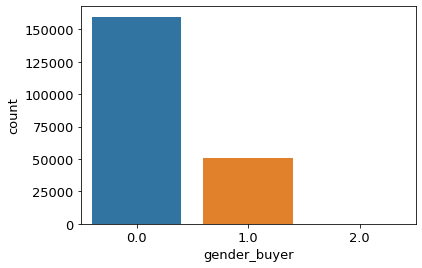

In [95]:
sns.countplot(data = merge_df[merge_df['refunded_at'].notna()], x = 'gender_buyer')

#### The gender distribution of the buyer who asked for refund is also similar to the overall gender distribution

## Assumption: as I mentioned above, although some columns that might indicate time is not in date-time format, it should be numbered in order, but with unknown time-step. Carrying this assumption, I would like to try formatting it and making it into a time-series dataset to be analyzed.

#### The main objetives would be to use first_paid_at as the time steps and to analyze the GMV from different angles over-time. I would also like to visualize and find out the effect of promotion during those time steps.

In [96]:
time_series_df = merge_df

In [97]:
time_series_df['time_step'] = round((((time_series_df['paid_at']- 1.39e12)/ 1e3) - 2.3e5) / 1e4 *2) / 2

#### During the process of converting first_paid_at as time steps, I used custom scaling to make the minimum value of first_paid_at to be 0.5, while still keeping the maximum value to be proportional.

In [98]:
time_step = time_series_df.groupby('time_step')['gmv_scaled'].agg(['sum', 'mean', 'count'])

In [99]:
time_step['cumsum'] = time_step['sum'].cumsum()

In [100]:
time_step

,sum,mean,count,cumsum
time_step,,,,
0.5,48.562975,0.462505,105,4.856298e+01
1.0,1163.150730,0.461202,2522,1.211714e+03
1.5,1068.267146,0.458681,2329,2.279981e+03
2.0,1630.941887,0.458903,3554,3.910923e+03
2.5,1466.360309,0.459962,3188,5.377283e+03
...,...,...,...,...
266.5,2639.891741,0.458553,5757,1.651633e+06
267.0,3127.820380,0.457417,6838,1.654761e+06
267.5,2868.492352,0.459621,6241,1.657629e+06


#### Plotting the values with time-series format and putting the promo on the first time step that it was used on the merged datasets

In [101]:
unique_promos = promos.sort_values(by = 'trx_id').reset_index().drop('index', axis=1).drop(['trx_id','id'], axis=1).drop_duplicates(keep = 'first')

In [102]:
unique_promos

,promo_type,promo_campaign,amount,frequency
0,1,229.0,-1.836041,569237
5,0,101.0,-1.836041,404421
15,0,113.0,-1.836041,38932
16,1,116.0,-0.632073,66580
47,1,207.0,-1.836041,54429
...,...,...,...,...
1288129,0,85.0,-2.934641,2
1289994,0,174.0,-2.934641,1
1322198,0,160.0,-2.934641,1
1358492,0,138.0,-2.934641,2


In [103]:
promos_first_appearance = promos.sort_values(by = 'trx_id').reset_index().drop('index', axis=1).loc[unique_promos.index]

In [104]:
promos_first_appearance

,id,trx_id,promo_type,promo_campaign,amount,frequency
0,41311199,261555739,1,229.0,-1.836041,569237
5,41308279,262543379,0,101.0,-1.836041,404421
15,41288069,262721444,0,113.0,-1.836041,38932
16,41331154,262722759,1,116.0,-0.632073,66580
47,41273654,262774334,1,207.0,-1.836041,54429
...,...,...,...,...,...,...
1288129,49971344,315363601,0,85.0,-2.934641,2
1289994,49987787,315518315,0,174.0,-2.934641,1
1322198,50267647,317488689,0,160.0,-2.934641,1
1358492,50600084,320260829,0,138.0,-2.934641,2


In [105]:
temp_time_step = time_series_df[time_series_df['payment_id'].isin(promos_first_appearance['trx_id'])][['time_step', 'payment_id']]

In [106]:
merge_time_step_df = pd.merge(promos_first_appearance, temp_time_step, left_on = 'trx_id', right_on = 'payment_id')

In [107]:
merge_time_step_df

,id,trx_id,promo_type,promo_campaign,amount,frequency,time_step,payment_id
0,41311199,261555739,1,229.0,-1.836041,569237,1.5,261555739
1,41308279,262543379,0,101.0,-1.836041,404421,2.5,262543379
2,41288069,262721444,0,113.0,-1.836041,38932,4.0,262721444
3,41331154,262722759,1,116.0,-0.632073,66580,3.5,262722759
4,41273654,262774334,1,207.0,-1.836041,54429,0.5,262774334
...,...,...,...,...,...,...,...,...
254,49971344,315363601,0,85.0,-2.934641,2,241.0,315363601
255,49987787,315518315,0,174.0,-2.934641,1,241.5,315518315
256,50267647,317488689,0,160.0,-2.934641,1,249.0,317488689
257,50600084,320260829,0,138.0,-2.934641,2,260.0,320260829


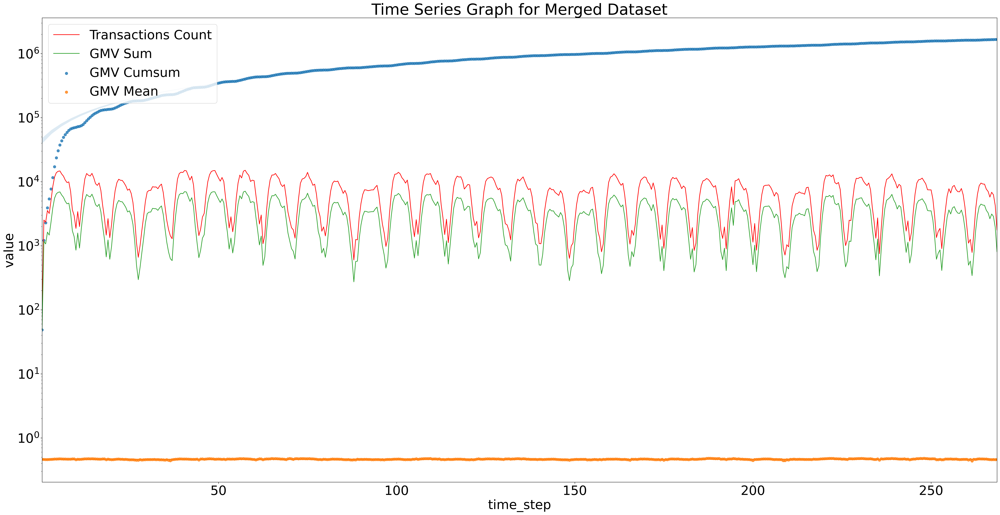

In [108]:
plt.rcParams.update({'font.size': 30})
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'cumsum', label = 'GMV Cumsum')
sns.regplot(data = time_step, x = time_step.index, y = 'mean', label = 'GMV Mean')
sns.lineplot(data = time_step, x = time_step.index, y = 'count', color = 'r', label = 'Transactions Count')
sns.lineplot(data = time_step, x = time_step.index, y = 'sum', label = 'GMV Sum')

plt.yscale('log')
plt.ylabel('value')
plt.title('Time Series Graph for Merged Dataset')
plt.legend()

#### ** Please note that for Cumulative Summary and Summary, although the trend is acccurate, the shape of the line might not be accurate (possibly distorted) compared to the actual shape since the values are scaled

#### For promo with type 1:

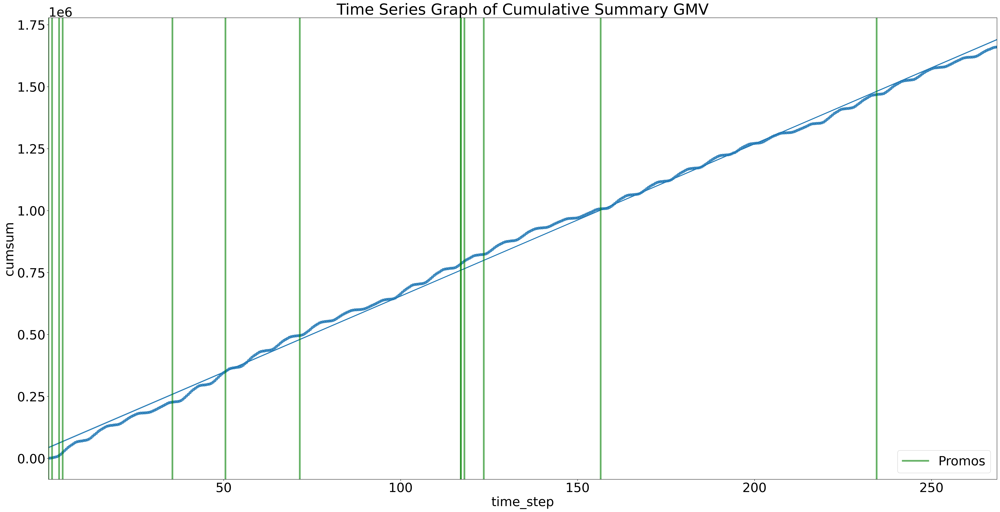

In [109]:
plt.rcParams.update({'font.size': 30})
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'cumsum')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)
    
plt.title('Time Series Graph of Cumulative Summary GMV')
plt.legend([ax], ['Promos'])


#### The cumulative sum of GMV seems to be moving with a rather constant trend over time. There is no significant change observed in the trend after the promo has been implemented from each time step.

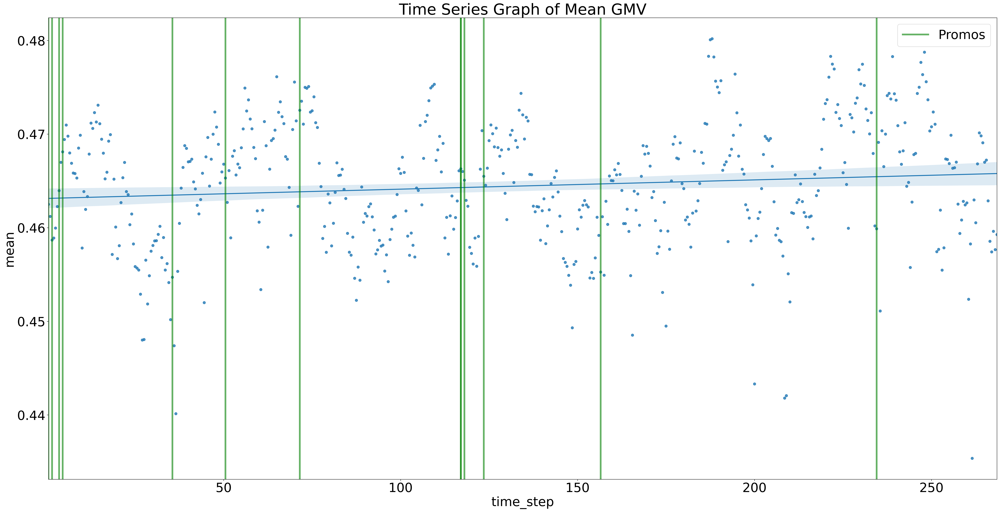

In [110]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'mean')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Mean GMV')
plt.legend([ax], ['Promos'])


#### It can be seen from the regression line that the mean value of GMV is gradually rising over time.

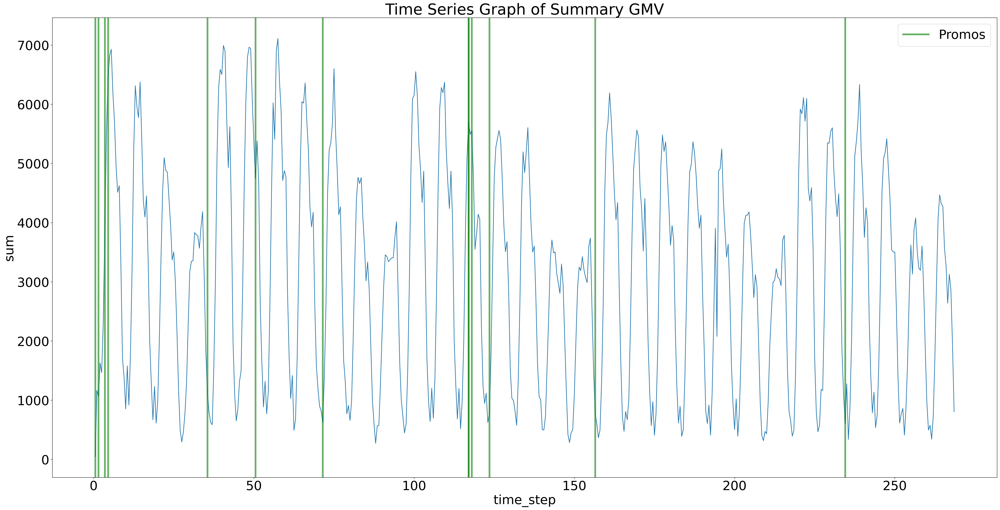

In [111]:
plt.figure(figsize = (40,20))
sns.lineplot(data = time_step, x = time_step.index, y = 'sum')
for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)
    
plt.title('Time Series Graph of Summary GMV')
plt.legend([ax], ['Promos'])

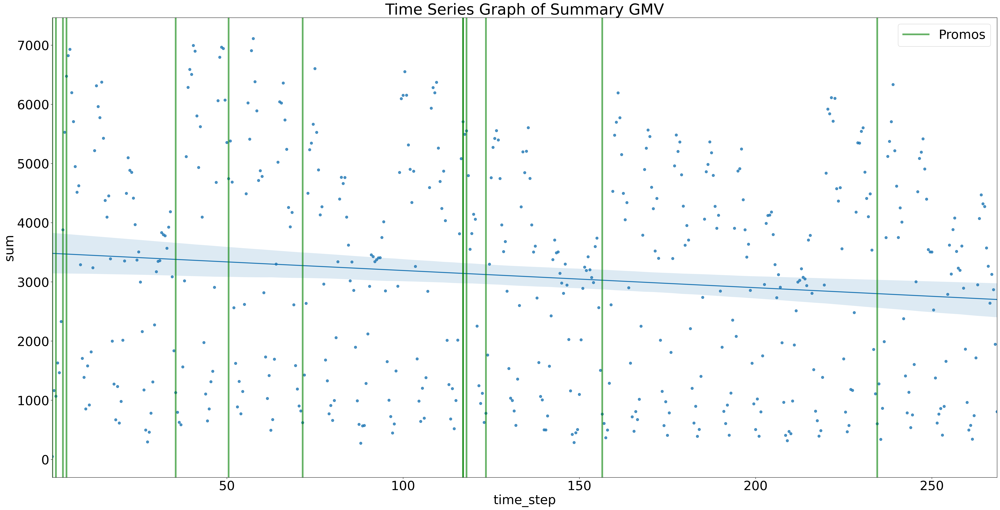

In [112]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'sum')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Summary GMV')
plt.legend([ax], ['Promos'])

#### The linegraph for summary of GMV displays cyclic or seasonal trend. From the graph, it can be seen that each time a promo was introduced, the trend would increase in the immediate few time steps. However, from the regression plot, the overall trend of the summary of GMV seems to be decreasing if the start and the end of time steps are considered.

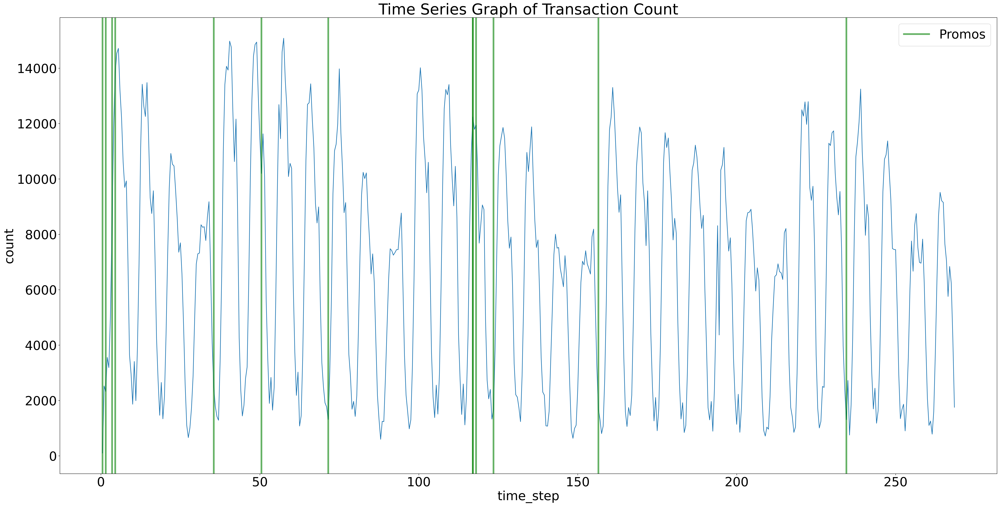

In [113]:
plt.figure(figsize = (40,20))
sns.lineplot(data = time_step, x = time_step.index, y = 'count')
for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)
    
plt.title('Time Series Graph of Transaction Count')
plt.legend([ax], ['Promos'])

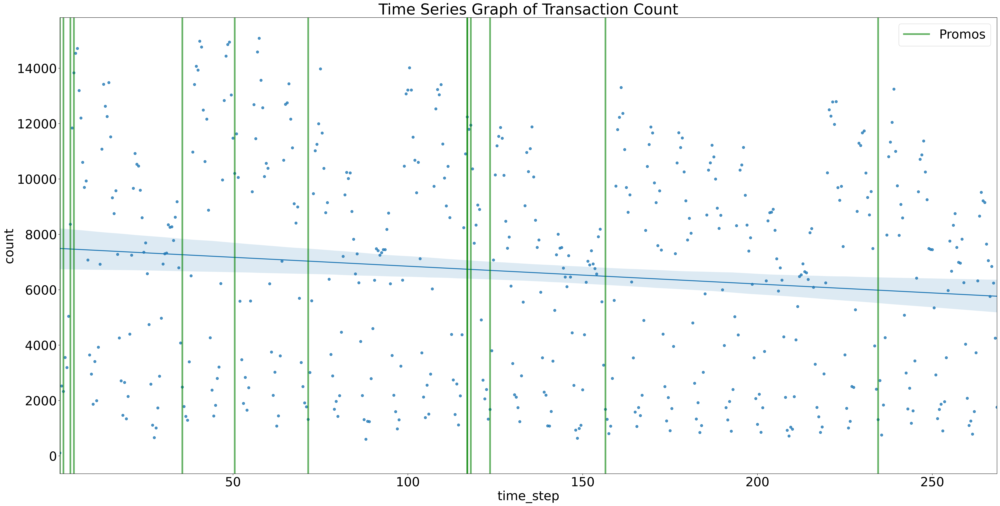

In [114]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'count')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 1]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Transaction Count')
plt.legend([ax], ['Promos'])


#### The same phenomenon that happens on summary of GMV also presents on the graph for Transactions Count. The lineplot shows cyclic nature for the graph. It can be observed that each time a promo was implemented, the Transactions Count would increase in the next few time steps. However, from the regression plot, it can be seen that the overall trend for Transactions Count is gradually decreasing. 

#### For promo with type 0:

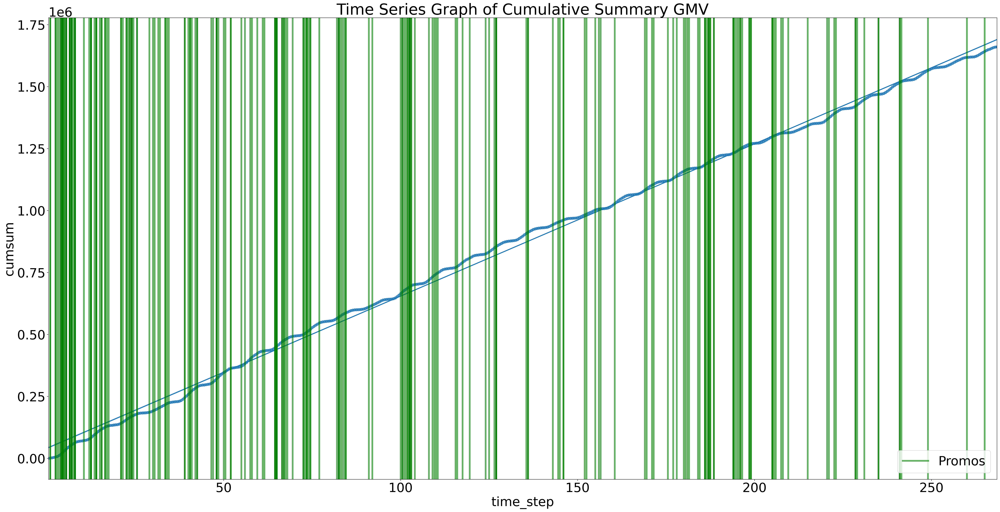

In [115]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'cumsum')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 0]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Cumulative Summary GMV')
plt.legend([ax], ['Promos'])


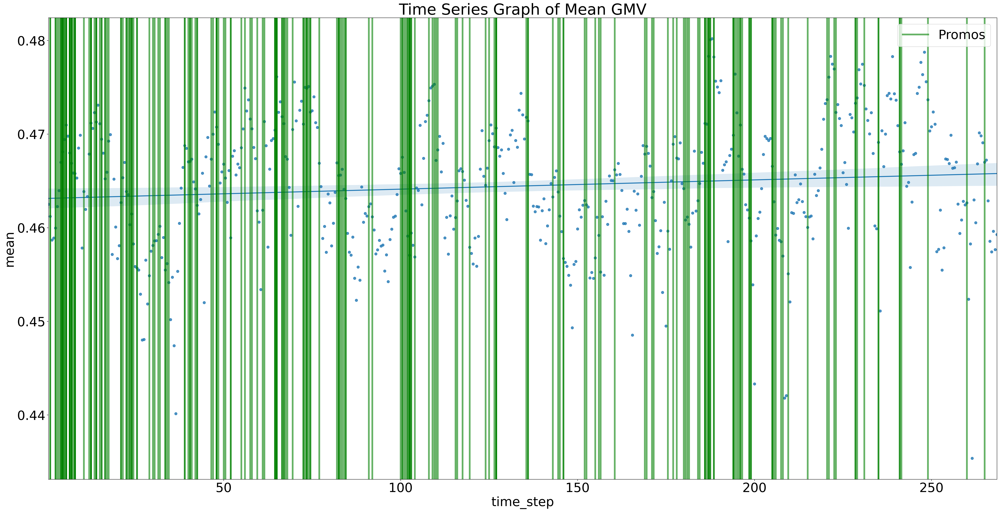

In [116]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'mean')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 0]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Mean GMV')
plt.legend([ax], ['Promos'])


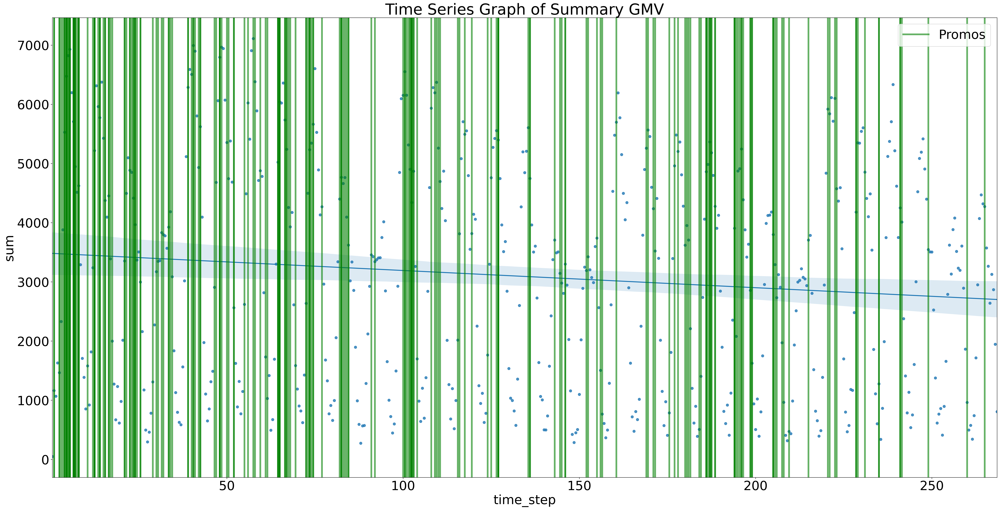

In [117]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'sum')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 0]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Summary GMV')
plt.legend([ax], ['Promos'])


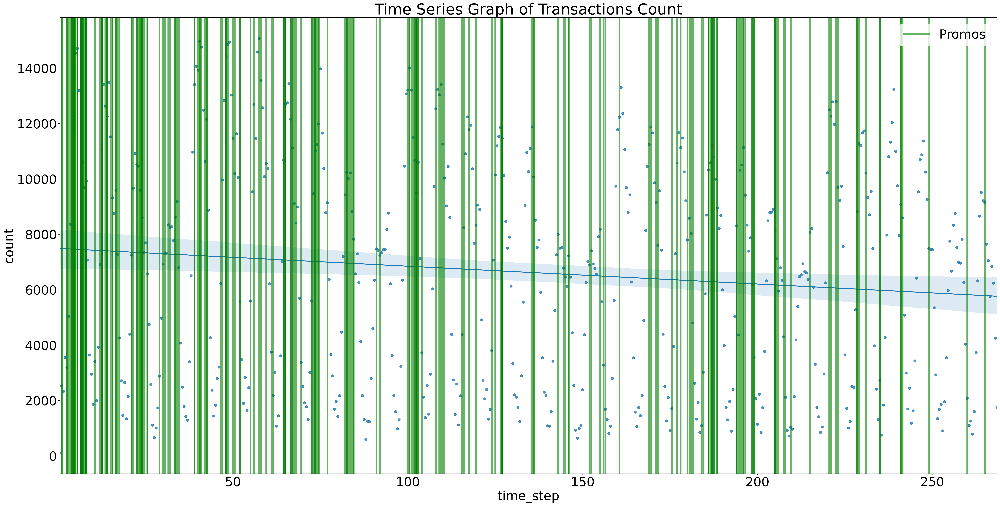

In [118]:
plt.figure(figsize = (40,20))
sns.regplot(data = time_step, x = time_step.index, y = 'count')

for x in merge_time_step_df[merge_time_step_df['promo_type'] == 0]['time_step']:
    ax = plt.axvline(x = x, color = 'g', alpha = 0.6, linewidth = 4.0)

plt.title('Time Series Graph of Transactions Count')
plt.legend([ax], ['Promos'])


#### It is quite hard to judge how promo type 0 affect the GMV and Transactions Count just by looking at the time series graph because it is very crowded. If we have the information on how the promo_campaigns are different from each other, we can visualize the important promos with type 0 that are expected to have the most impact on the graph to be analyzed on detail. However, the comments on the overall trends are still the same as the previous analyses. We also have to keep in mind that promo type 1 were used more frequently on transactions compared to promo type 0.